In [1]:
import pandas as pd

# to read and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# the geofile is file with the geometry element 
geofile = gpd.read_file('acs2019_5yr_B01003_14000US06037222001.geojson')
# the fhfa is the csv file with the data i want to map
fhfa = gpd.read_file('FHFA_HPI_Fixed.csv')

In [3]:
# listing what columns to keep 
columns_to_keep= ['geoid','name','B01003001','geometry']
# applying the function
geofile=geofile[columns_to_keep]

In [4]:
geofile.tail(2)

,geoid,name,B01003001,geometry
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
1004,16000US0644000,"Los Angeles, CA",3966936.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [5]:
geofile.columns= ['geoid','name','total population','geometry']

In [6]:
# dropping this row because it is not a census tract
geofile=geofile.drop([1004])

In [7]:
fhfa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1640 entries, 0 to 1639
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   addition to geoid  1640 non-null   object  
 1   geoid              1640 non-null   object  
 2   field_3            1640 non-null   object  
 3   hpi 2010           1640 non-null   object  
 4   hpi 2019           1640 non-null   object  
 5   % change           1640 non-null   object  
 6   geometry           0 non-null      geometry
dtypes: geometry(1), object(6)
memory usage: 89.8+ KB


In [8]:
# listing what columns to keep 
columns_to_keep= ['field_3','hpi 2010','hpi 2019','% change','geometry']

In [9]:
# applying the function
fhfa=fhfa[columns_to_keep]

In [10]:
# getting the list for the fhfa columns so i can copy and paste it later and rename it
list(fhfa)

['field_3', 'hpi 2010', 'hpi 2019', '% change', 'geometry']

In [11]:
# renaming the columns
fhfa.columns= ['geoid', 'hpi 2010', 'hpi 2019', 'pc_hpi', 'geometry']

In [12]:
# We cannot map objects so we must change them into floats, except for the geoid column
fhfa['hpi 2010'] = fhfa ['hpi 2010'].astype(float)
fhfa['hpi 2019'] = fhfa ['hpi 2019'].astype(float)
fhfa['pc_hpi'] = fhfa ['pc_hpi'].astype(float)

In [13]:
# merging the data
fhfa=fhfa.merge(geofile,on= 'geoid')

In [14]:
# naming the columns i need to keep
columns_to_keep= ['geoid','hpi 2010','hpi 2019','pc_hpi','name','total population','geometry_y']

In [15]:
# executing the function 
fhfa=fhfa[columns_to_keep]

In [16]:
# listing the column names so i can copy and paste
# i only need to change the geometry_y to geometry
# Ariana said if i didn't drop the y it would give me a hard time later 
list(fhfa)

['geoid',
 'hpi 2010',
 'hpi 2019',
 'pc_hpi',
 'name',
 'total population',
 'geometry_y']

In [17]:
# renaming the columns
fhfa.columns = ['geoid', 'hpi 2010', 'hpi 2019', 'pc_hpi', 'name','total population', 'geometry']
# checking to see if it worked 
fhfa.head(1)

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry
0,14000US06037101110,505.95,934.82,0.85,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."


In [18]:
# importing the parks data
parks = gpd.read_file('SoCalParks.zip')
parks.to_file('SoCalParks.geojson', driver='GeoJSON')

In [19]:
# changing the followng data columns to strings
parks['Park_Name'] = parks ['Park_Name'].astype(str)
parks['Park_Urban'] = parks ['Park_Urban'].astype(str)
parks['Park_Desig'] = parks ['Park_Desig'].astype(str)
parks['Park_Owner'] = parks ['Park_Owner'].astype(str)
parks['Park_Local'] = parks ['Park_Local'].astype(str)
parks['Park_Manag'] = parks ['Park_Manag'].astype(str)
parks['Park_Loc_1'] = parks ['Park_Loc_1'].astype(str)
parks['Park_Statu'] = parks ['Park_Statu'].astype(str)
parks['Park_Est_D'] = parks ['Park_Est_D'].astype(str)
parks['Park_Addre'] = parks ['Park_Addre'].astype(str)
parks['Park_State'] = parks ['Park_State'].astype(str)
parks['Park_Sta_1'] = parks ['Park_Sta_1'].astype(str)
parks['Park_Count'] = parks ['Park_Count'].astype(str)   
parks['Park_Cou_1'] = parks ['Park_Cou_1'].astype(str)     
parks['Park_Place'] = parks ['Park_Place'].astype(str)
parks['Park_Pla_1'] = parks ['Park_Pla_1'].astype(str)   
parks['Park_Urb_1'] = parks ['Park_Urb_1'].astype(str)     
parks['Park_Zip'] = parks ['Park_Zip'].astype(str)
parks['Park_Bound'] = parks ['Park_Bound'].astype(str)   
parks['Park_Sourc'] = parks ['Park_Sourc'].astype(str)     
parks['Park_Feedb'] = parks ['Park_Feedb'].astype(str)
parks['Park_DateA'] = parks ['Park_DateA'].astype(str) 
parks['DataShare_'] = parks ['DataShare_'].astype(str)

In [20]:
tenurechange = gpd.read_file('TenurePercentChange_LACounty.csv')

In [21]:
tenurechange.rename(columns = {'Geo_GEOID':'geoid'}, inplace = True)

In [22]:
joined = fhfa.merge(tenurechange,on='geoid')

In [23]:
joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 575 entries, 0 to 574
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        575 non-null    object  
 1   hpi 2010                     575 non-null    float64 
 2   hpi 2019                     575 non-null    float64 
 3   pc_hpi                       575 non-null    float64 
 4   name                         575 non-null    object  
 5   total population             575 non-null    float64 
 6   geometry_x                   575 non-null    geometry
 7   Geo_FIPS                     575 non-null    object  
 8   Geo_NAME                     575 non-null    object  
 9   Geo_QName                    575 non-null    object  
 10  Geo_STUSAB                   575 non-null    object  
 11  Geo_TRACT                    575 non-null    object  
 12  2019_Occupied Housing Units  575 non-null    object  
 13  2019_

In [24]:
joined.rename(columns = {'geometry_x':'geometry'}, inplace = True)

In [25]:
joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 575 entries, 0 to 574
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        575 non-null    object  
 1   hpi 2010                     575 non-null    float64 
 2   hpi 2019                     575 non-null    float64 
 3   pc_hpi                       575 non-null    float64 
 4   name                         575 non-null    object  
 5   total population             575 non-null    float64 
 6   geometry                     575 non-null    geometry
 7   Geo_FIPS                     575 non-null    object  
 8   Geo_NAME                     575 non-null    object  
 9   Geo_QName                    575 non-null    object  
 10  Geo_STUSAB                   575 non-null    object  
 11  Geo_TRACT                    575 non-null    object  
 12  2019_Occupied Housing Units  575 non-null    object  
 13  2019_

In [26]:
joined=joined.drop(columns=['geometry_y'])

In [27]:
joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 575 entries, 0 to 574
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        575 non-null    object  
 1   hpi 2010                     575 non-null    float64 
 2   hpi 2019                     575 non-null    float64 
 3   pc_hpi                       575 non-null    float64 
 4   name                         575 non-null    object  
 5   total population             575 non-null    float64 
 6   geometry                     575 non-null    geometry
 7   Geo_FIPS                     575 non-null    object  
 8   Geo_NAME                     575 non-null    object  
 9   Geo_QName                    575 non-null    object  
 10  Geo_STUSAB                   575 non-null    object  
 11  Geo_TRACT                    575 non-null    object  
 12  2019_Occupied Housing Units  575 non-null    object  
 13  2019_

In [28]:
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [29]:
# addressing the error as there is no Dataframe
from geopandas import GeoDataFrame
# updating the dataset so it is a dataframe
joined = GeoDataFrame(joined) # i did this one already but i think it should be good to have it all in one place
parks= GeoDataFrame(parks)

joined = joined.to_crs(epsg=3857)
parks = parks.to_crs(epsg=3857)

In [30]:
# now I am joining the parks and fhfa dataset. 
# from my understanding this is different from merging as we are not merging it using a column.
parks_join = gpd.sjoin(joined, parks, how='left')

# checking to see if the function worked
parks_join.head(2)

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry,Geo_FIPS,Geo_NAME,Geo_QName,...,SUM_BLACK_,SUM_AMERIN,SUM_ASIAN_,SUM_PACIFI,SUM_OTHRAC,SUM_RACE2U,SUM_HISP_S,PLACEKEY,Shape_Leng,Shape_Area
0,14000US06037101110,505.95,934.82,0.85,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",6037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",...,76.0,13.0,626.0,3.0,11.0,238.0,2082.0,@5z5-36j-zpv,605.518592,14813.085294
0,14000US06037101110,505.95,934.82,0.85,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",6037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",...,23.0,9.0,509.0,3.0,13.0,122.0,1166.0,@5z5-36c-n5z,242.223533,3048.176529


In [31]:
parks_by_ct = parks_join.geoid.value_counts().rename_axis('geoid').reset_index(name='parks_count')

In [32]:
parks_by_ct.head(3)

,geoid,parks_count
0,14000US06037143901,9
1,14000US06037181000,8
2,14000US06037185100,8


In [33]:
parks=parks_join.merge(parks_by_ct, on ='geoid') 

In [34]:
parks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 786 entries, 0 to 785
Data columns (total 74 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        786 non-null    object  
 1   hpi 2010                     786 non-null    float64 
 2   hpi 2019                     786 non-null    float64 
 3   pc_hpi                       786 non-null    float64 
 4   name                         786 non-null    object  
 5   total population             786 non-null    float64 
 6   geometry                     786 non-null    geometry
 7   Geo_FIPS                     786 non-null    object  
 8   Geo_NAME                     786 non-null    object  
 9   Geo_QName                    786 non-null    object  
 10  Geo_STUSAB                   786 non-null    object  
 11  Geo_TRACT                    786 non-null    object  
 12  2019_Occupied Housing Units  786 non-null    object  
 1

In [35]:
# seeing if the merge worked. 
parks.sample()

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry,Geo_FIPS,Geo_NAME,Geo_QName,...,SUM_AMERIN,SUM_ASIAN_,SUM_PACIFI,SUM_OTHRAC,SUM_RACE2U,SUM_HISP_S,PLACEKEY,Shape_Leng,Shape_Area,parks_count
346,14000US06037137302,314.76,467.16,0.48,"Census Tract 1373.02, Los Angeles, CA",4449.0,"MULTIPOLYGON (((-13210079.367 4053554.545, -13...",6037137302,Census Tract 1373.02,"Census Tract 1373.02, Los Angeles County, Cali...",...,2.0,193.0,4.0,3.0,86.0,213.0,@5z4-zjf-sdv,803.439255,35251.423688,1


In [36]:
parks['total population'].describe()

count     786.000000
mean     4199.260814
std      1240.513675
min      1161.000000
25%      3226.500000
50%      4097.500000
75%      4974.000000
max      8735.000000
Name: total population, dtype: float64

## Normalizing: Parks per 1000 people 

In [37]:
parks['parks_per_1000'] = parks['parks_count']/(parks['total population'])*1000

In [38]:
parks.sort_values(by="parks_per_1000").head(2)

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry,Geo_FIPS,Geo_NAME,Geo_QName,...,SUM_ASIAN_,SUM_PACIFI,SUM_OTHRAC,SUM_RACE2U,SUM_HISP_S,PLACEKEY,Shape_Leng,Shape_Area,parks_count,parks_per_1000
121,14000US06037111400,534.59,863.79,0.62,"Census Tract 1114, Los Angeles, CA",8735.0,"MULTIPOLYGON (((-13191626.269 4062578.493, -13...",6037111400,Census Tract 1114,"Census Tract 1114, Los Angeles County, California",...,1742.0,17.0,29.0,239.0,2995.0,@5z4-vrr-mkz,1153.280654,71860.651677,1,0.114482
167,14000US06037119002,454.75,872.59,0.92,"Census Tract 1190.02, Los Angeles, CA",7976.0,"MULTIPOLYGON (((-13184693.403 4062817.275, -13...",6037119002,Census Tract 1190.02,"Census Tract 1190.02, Los Angeles County, Cali...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0.125376


In [39]:
parks['parks_per_1000'].describe()

count    786.000000
mean       0.544393
std        0.487413
min        0.114482
25%        0.226899
50%        0.331017
75%        0.688863
max        2.784223
Name: parks_per_1000, dtype: float64

1 = 0-0.282547

2 = 0.282547-0.527016

3 =  0.527016-1.015486

4 = >1.015486

Parks per thousand people:

- 25% = 1; lowest amount of parks per 1000 people
- 50% = 2
- 75% = 3
- 100% = 4; highest amount of parks per 1000 people


In [40]:
conditions = [
    (parks['parks_per_1000'] < 0.282547), # lowest parks
    (parks['parks_per_1000'] < 0.527016 ) & (parks['parks_per_1000'] >= 0.282547 ),   #second lowest
    (parks['parks_per_1000'] <1.015486) & (parks['parks_per_1000'] >= 0.527016), #second highest
    (parks['parks_per_1000'] >=1.015486)    # highest parks
    ]


# create a list of the values we want to assign for each condition
values = [
    1, 
    2, 
    3, 
    4
    ]

# create a new column and use np.select to assign values to it using our lists as arguments
import numpy as np
parks['park_index'] = np.select(conditions, values)

In [41]:
parks['pc_hpi'].describe()

count    786.000000
mean       0.822201
std        0.323753
min        0.080000
25%        0.580000
50%        0.780000
75%        1.000000
max        2.070000
Name: pc_hpi, dtype: float64

1 = 0-0.512500

2 = 0.512500-0.760000

3 = 0.760000-0.980000

4 = >0.980000

Percent Change in Housing Prices

- 25% = 1; lowest increase in housing prices
- 50% = 2
- 75% = 3
- 100% = 4; highest increase in housing prices

In [42]:
conditions = [
    (parks['pc_hpi'] < 0.512500), # lowest increase (highest decrease) in percent change in housing prices
    (parks['pc_hpi'] < 0.760000 ) & (parks['pc_hpi'] >= 0.512500 ),   #second lowest
    (parks['pc_hpi'] <0.980000) & (parks['pc_hpi'] >= 0.760000), #second highest
    (parks['pc_hpi'] >=0.980000)    # highest increase in percent change in housing prices
    ]


# create a list of the values we want to assign for each condition
values = [
    1, 
    2, 
    3, 
    4
    ]

# create a new column and use np.select to assign values to it using our lists as arguments
import numpy as np
parks['hpi_index'] = np.select(conditions, values)

In [43]:
parks['PC_Renters'].describe()

count     786
unique    561
top         0
freq       19
Name: PC_Renters, dtype: object

For percent change in renters, the quantiles will go:

1 = >24.924925

2 = 7.314011- 24.924925

3 = -4.372782 - 7.314011

4 = -74.074074 - -4.372782


We chose to have it so that the first quantile is for percent change in renters with the highest increase and the fourth quantile is for percent change in renters with the highest decrease. 

Time to make conditions and then map it! 

In [44]:
parks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 786 entries, 0 to 785
Data columns (total 77 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        786 non-null    object  
 1   hpi 2010                     786 non-null    float64 
 2   hpi 2019                     786 non-null    float64 
 3   pc_hpi                       786 non-null    float64 
 4   name                         786 non-null    object  
 5   total population             786 non-null    float64 
 6   geometry                     786 non-null    geometry
 7   Geo_FIPS                     786 non-null    object  
 8   Geo_NAME                     786 non-null    object  
 9   Geo_QName                    786 non-null    object  
 10  Geo_STUSAB                   786 non-null    object  
 11  Geo_TRACT                    786 non-null    object  
 12  2019_Occupied Housing Units  786 non-null    object  
 1

In [45]:
parks['PC_Renters'] = parks['PC_Renters'].astype(float)

In [46]:
conditions1 = [
    (parks['PC_Renters'] < -4.372782), # lowest increase (highest decrease) in percent change in renters
    (parks['PC_Renters'] < 7.314011) & (parks['PC_Renters'] >= -4.372782),   
    (parks['PC_Renters'] < 24.924925) & (parks['PC_Renters'] >= 7.314011), 
    (parks['PC_Renters'] >= 24.924925)    # highest increase in percent change in renters
    ]


# create a list of the values we want to assign for each condition
values1 = [
    4, 
    3, 
    2, 
    1
    ]

# create a new column and use np.select to assign values to it using our lists as arguments
parks['renter_index'] = np.select(conditions1, values1)

In [47]:
parks.sample()

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry,Geo_FIPS,Geo_NAME,Geo_QName,...,SUM_RACE2U,SUM_HISP_S,PLACEKEY,Shape_Leng,Shape_Area,parks_count,parks_per_1000,park_index,hpi_index,renter_index
122,14000US06037113101,641.13,958.49,0.5,"Census Tract 1131.01, Los Angeles, CA",3719.0,"MULTIPOLYGON (((-13202181.249 4063428.729, -13...",6037113101,Census Tract 1131.01,"Census Tract 1131.01, Los Angeles County, Cali...",...,NaN,NaN,NaN,NaN,NaN,1,0.268889,1,1,1


In [48]:
parks['disp_index'] = parks['park_index'] + parks['hpi_index'] + parks['renter_index']

In [49]:
parks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 786 entries, 0 to 785
Data columns (total 79 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   geoid                        786 non-null    object  
 1   hpi 2010                     786 non-null    float64 
 2   hpi 2019                     786 non-null    float64 
 3   pc_hpi                       786 non-null    float64 
 4   name                         786 non-null    object  
 5   total population             786 non-null    float64 
 6   geometry                     786 non-null    geometry
 7   Geo_FIPS                     786 non-null    object  
 8   Geo_NAME                     786 non-null    object  
 9   Geo_QName                    786 non-null    object  
 10  Geo_STUSAB                   786 non-null    object  
 11  Geo_TRACT                    786 non-null    object  
 12  2019_Occupied Housing Units  786 non-null    object  
 1

In [50]:
parks.sample()

,geoid,hpi 2010,hpi 2019,pc_hpi,name,total population,geometry,Geo_FIPS,Geo_NAME,Geo_QName,...,SUM_HISP_S,PLACEKEY,Shape_Leng,Shape_Area,parks_count,parks_per_1000,park_index,hpi_index,renter_index,disp_index
557,14000US06037201401,337.1,759.57,1.25,"Census Tract 2014.01, Los Angeles, CA",4693.0,"MULTIPOLYGON (((-13157270.291 4038958.320, -13...",6037201401,Census Tract 2014.01,"Census Tract 2014.01, Los Angeles County, Cali...",...,4225.0,@5z5-3rm-grk,3733.108683,374084.369047,2,0.426167,2,4,3,9


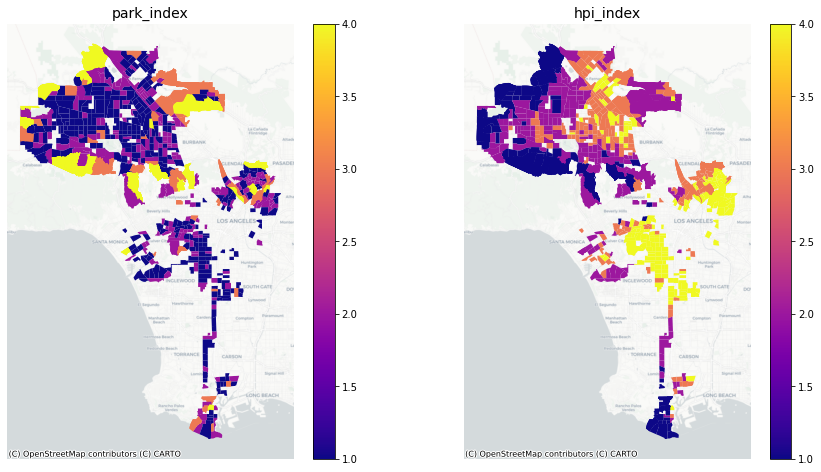

In [51]:
column1 = 'park_index'
column2 = 'hpi_index'
fig,ax = plt.subplots(1,2,figsize=(15,8))

parks.plot(ax=ax[0],
         column=column1,
         legend=True, 
         cmap='plasma'
        )

ax[0].set_title(column1, fontsize=14)
ax[0].axis('off');

parks.plot(ax=ax[1],
         column=column2,
         legend=True,
         cmap='plasma'
        )
ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron)
ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron)
ax[1].set_title(column2, fontsize=14)
ax[1].axis('off');

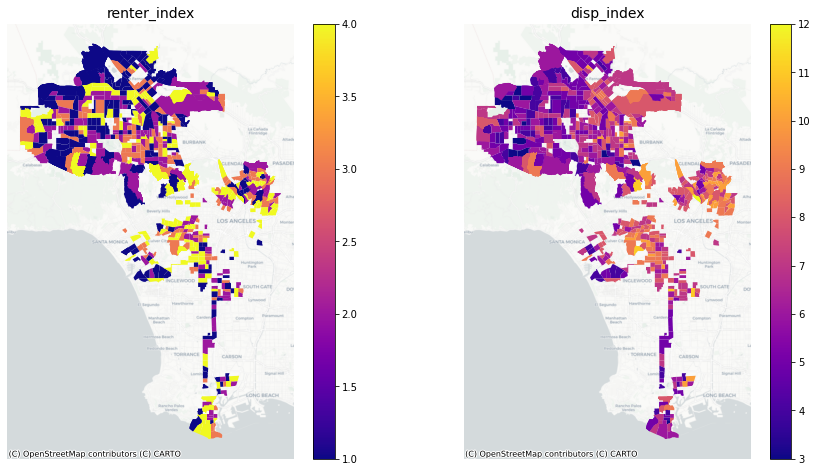

In [52]:
column1 = 'renter_index'
column2 = 'disp_index'
fig,ax = plt.subplots(1,2,figsize=(15,8))

parks.plot(ax=ax[0],
         column=column1,
         legend=True, 
         cmap='plasma'
        )

ax[0].set_title(column1, fontsize=14)
ax[0].axis('off');

parks.plot(ax=ax[1],
         column=column2,
         legend=True,
         cmap='plasma'
        )
ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron)
ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron)
ax[1].set_title(column2, fontsize=14)
ax[1].axis('off');



In [53]:
# interactive version needs to be in WGS84
parks_web = parks.to_crs('EPSG:4326')

In [54]:
# what's the centroid?
minx, miny, maxx, maxy = parks_web.geometry.total_bounds
center_lat_parks_web = (maxy-miny)/2+miny
center_lon_parks_web = (maxx-minx)/2+minx

In [55]:
# some stats
parks_web.disp_index.describe()

count    786.000000
mean       7.125954
std        1.827089
min        3.000000
25%        6.000000
50%        7.000000
75%        8.000000
max       12.000000
Name: disp_index, dtype: float64

In [56]:
# grab the median
median = parks_web.disp_index.median()

In [57]:
token='pk.eyJ1IjoiaG9vZGluYyIsImEiOiJja3pzdTJuMGQwOHhzMnZtaDIyMDU5Nzk3In0.KlNbgSNa7s6XD2BPuP24ww'
px.set_mapbox_access_token(token)

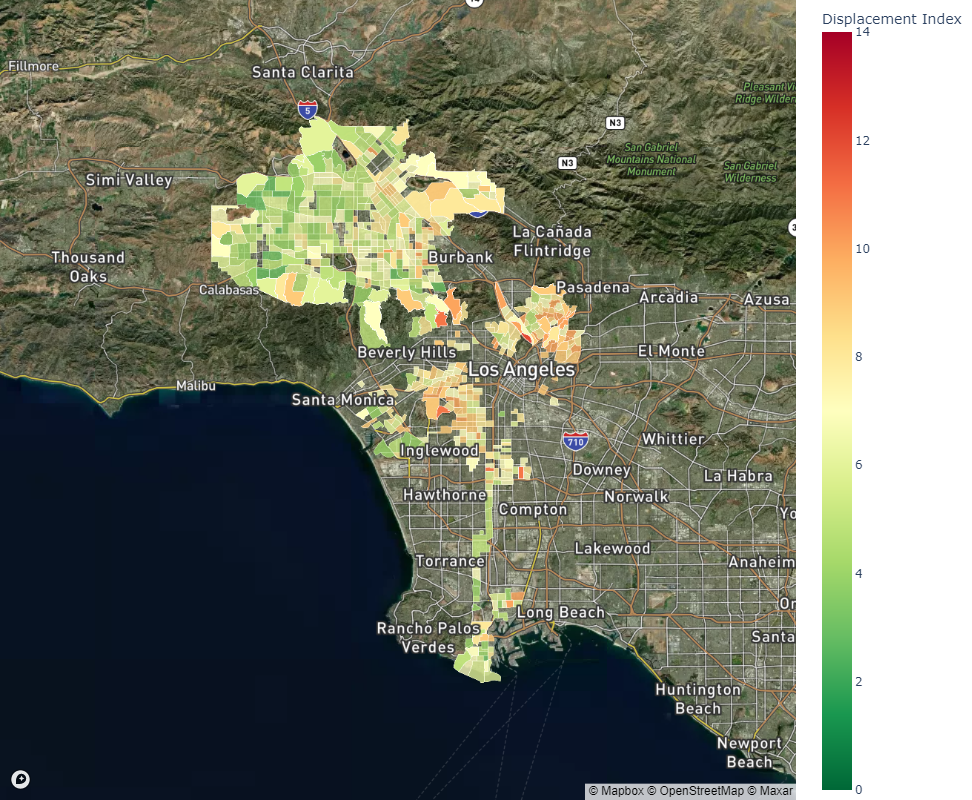

In [58]:
fig = px.choropleth_mapbox(parks_web, 
                     geojson=parks_web.geometry, # the geometry column
                     locations=parks_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='disp_index',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['Park_Name','Park_Local','geoid','pc_hpi','parks_count','parks_per_1000','park_index','hpi_index','renter_index','disp_index'],
                     center = {"lat":center_lat_parks_web, "lon":center_lon_parks_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'parks_per_1000':'Parks per 1000',
                             'disp_index':'Displacement Index',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [68]:
fig.write_html("Disp_map_plotly.html")

In [60]:
parks['disp_index'].describe()

count    786.000000
mean       7.125954
std        1.827089
min        3.000000
25%        6.000000
50%        7.000000
75%        8.000000
max       12.000000
Name: disp_index, dtype: float64

In [61]:
disp_ct= parks.geoid.value_counts().rename_axis('geoid').reset_index(name='disp_index')

In [62]:
disp_ct.head(2)

,geoid,disp_index
0,14000US06037143901,9
1,14000US06037181000,8


In [63]:
parks['geoid'].describe()

count                    786
unique                   575
top       14000US06037143901
freq                       9
Name: geoid, dtype: object

Text(0, 0.5, 'Frequency')

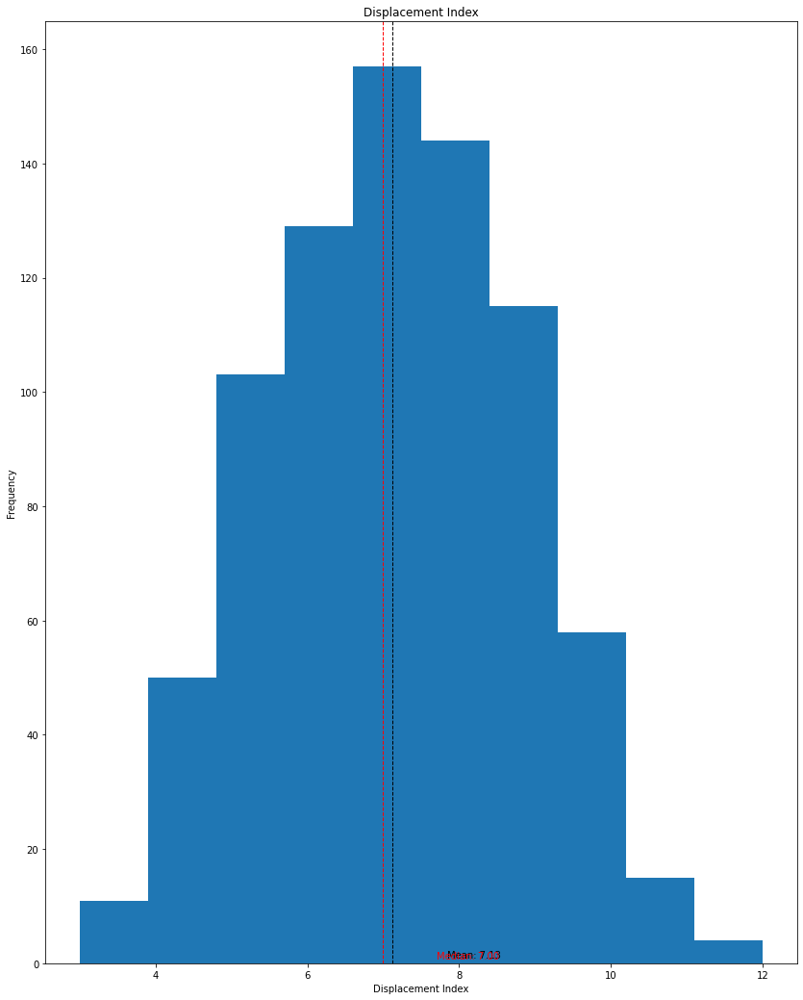

In [64]:
import matplotlib.pyplot as plt

plt.axvline(parks.disp_index.mean(), color='k', linestyle='dashed', linewidth=1)
plt.axvline(parks.disp_index.median(), color='r', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(parks.disp_index.mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(parks.disp_index.mean()))
plt.text(parks.disp_index.median()*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(parks.disp_index.median()),color='r')

ax=parks['disp_index'].plot.hist(figsize=(14,18),title="Displacement Index")
parks.sort_values(by='disp_index')

ax.set_xlabel("Displacement Index")
ax.set_ylabel("Frequency")

In [65]:
parks['parks_count'].describe()

count    786.000000
mean       2.127226
std        1.859141
min        1.000000
25%        1.000000
50%        1.000000
75%        3.000000
max        9.000000
Name: parks_count, dtype: float64

Text(0, 0.5, 'Frequency')

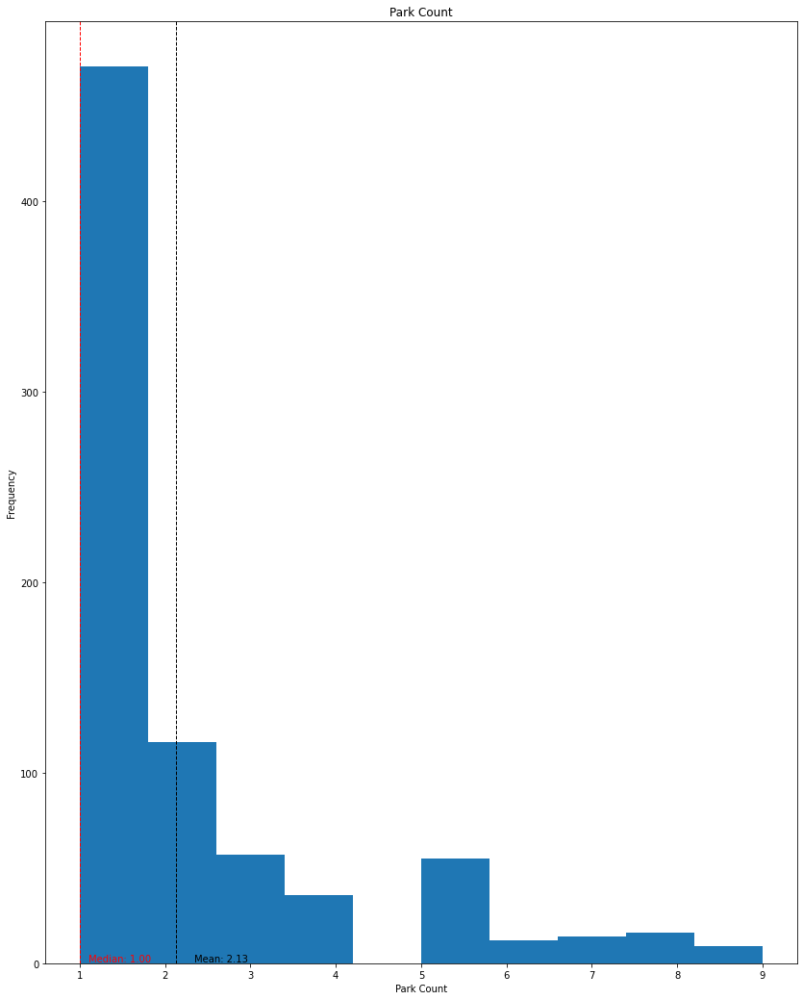

In [66]:
plt.axvline(parks.parks_count.mean(), color='k', linestyle='dashed', linewidth=1)
plt.axvline(parks.parks_count.median(), color='r', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(parks.parks_count.mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(parks.parks_count.mean()))
plt.text(parks.parks_count.median()*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(parks.parks_count.median()),color='r')

ax=parks['parks_count'].plot.hist(figsize=(14,18),title="Park Count")
ax.set_xlabel("Park Count")
ax.set_ylabel("Frequency")

Text(0, 0.5, 'Frequency')

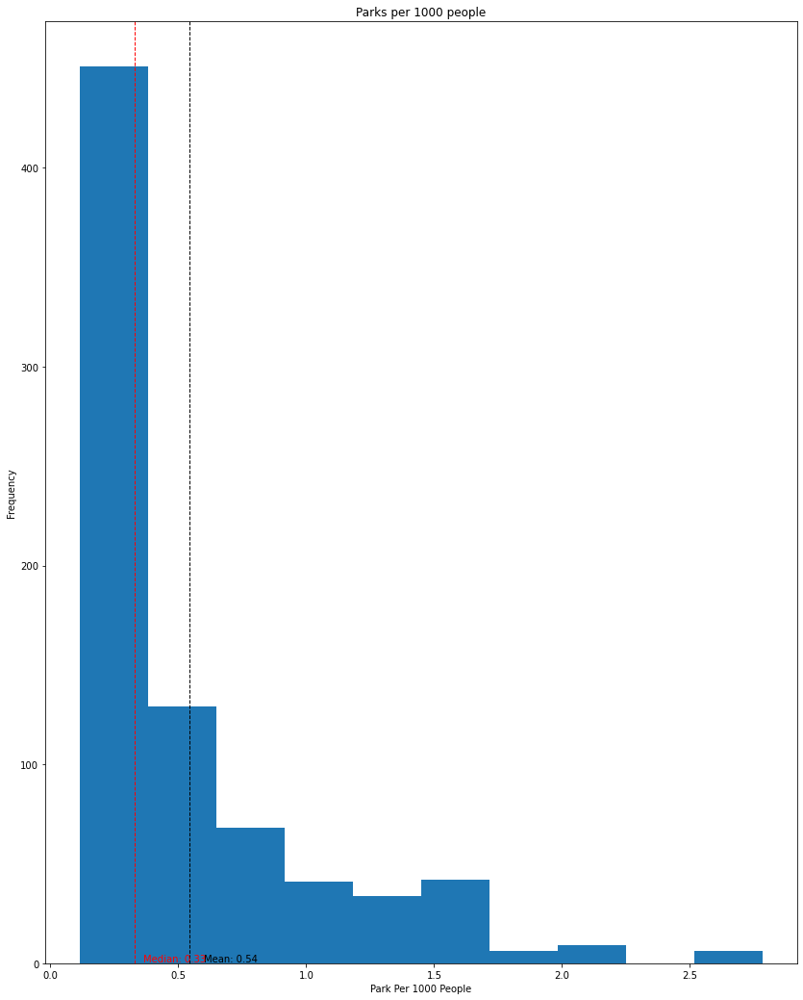

In [67]:
plt.axvline(parks.parks_per_1000.mean(), color='k', linestyle='dashed', linewidth=1)
plt.axvline(parks.parks_per_1000.median(), color='r', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(parks.parks_per_1000.mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(parks.parks_per_1000.mean()))
plt.text(parks.parks_per_1000.median()*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(parks.parks_per_1000.median()),color='r')

ax=parks['parks_per_1000'].plot.hist(figsize=(14,18),title="Parks per 1000 people")
ax.set_xlabel("Park Per 1000 People")
ax.set_ylabel("Frequency")